In [1]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from scipy import signal
from matplotlib import animation, rc
from IPython.display import HTML
from utils import *
%matplotlib inline

# Wall thickness

We also have the difference of wall thickness in systole and diastole

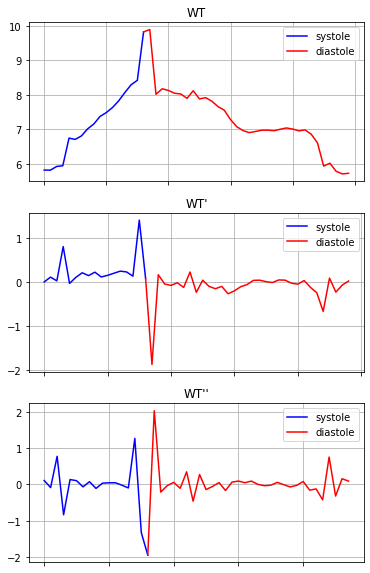

In [4]:
Image.open("WallThickness.png")

# Left Ventricle Shape

TODO: Implement quality check

In [3]:
image_path = "data/1013344/la_4ch.nii.gz"
seg_image_path = "data/1013344/seg4_la_4ch.nii.gz"
orig_image, masked_image,shape_properties = segment_left_ventricle(image_path,seg_image_path)
angle_variation = np.max(shape_properties[0,:,2])-np.min(shape_properties[0,:,2])
create_video_lv(orig_image,masked_image,shape_properties,cut=0)

# Papillary mass

In [2]:
image_path = "demo_image/1000012/sa.nii.gz"
seg_image_path = "demo_image/1000012/seg_sa.nii.gz"
orig,masked = segment_papillary(image_path,seg_image_path,thres=0.40)
create_video(orig,masked,cut=6)

/workspace/Milos/UKB/utils.py:208: RuntimeWarning: invalid value encountered in true_divide
  img=img / np.max(img)


In [2]:
image_path = "demo_image/1000012/sa.nii.gz"
seg_image_path = "demo_image/1000012/seg_sa.nii.gz"
mass_per_frame = get_papillary_mass(image_path,seg_image_path)

/workspace/Milos/UKB/utils.py:208: RuntimeWarning: invalid value encountered in true_divide
  img=img / np.max(img)


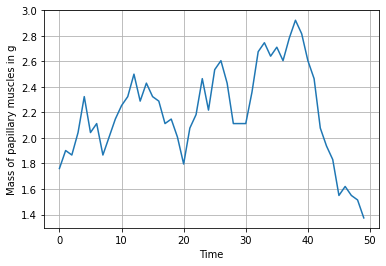

In [3]:
plt.plot(mass_per_frame)
plt.ylabel("Mass of papillary muscles in g")
plt.xlabel("Time")
plt.grid()
plt.show()

# Relative position of papillary muscles

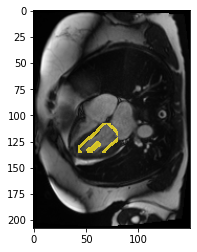

In [5]:
Image.open("PositionPapillary.png")

# Fractal Dimension / trabeculae shape

In [3]:
image_path = "demo_image/1000012/sa.nii.gz"
seg_image_path = "demo_image/1000012/seg_sa.nii.gz"
image,masked_image = fractal_dim(image_path, seg_image_path)
create_video(image,masked_image,cut=6)

/workspace/Milos/UKB/utils.py:281: RuntimeWarning: invalid value encountered in true_divide
  mask = mask/(np.max(mask)-np.min(mask))
/workspace/Milos/UKB/utils.py:296: RuntimeWarning: invalid value encountered in true_divide
  img = (img/np.max(img))*255


# Mitral Valve

In [10]:
figs,dists = segment_mitral_valve("data/1000012/la_4ch.nii.gz","data/1000012/seg4_la_4ch.nii.gz")
fig, ax = plt.subplots()
plt.close()
def animator(N): # N is the animation frame number
    ax.clear()
    ax.imshow(figs[N][0],cmap='gray')
    ax.plot([figs[N][1][0]],[figs[N][2][0]],'*',alpha=0.5)
    ax.plot([figs[N][1][-1]],[figs[N][2][-1]],'*',alpha=0.5)
    ax.plot(figs[N][1],figs[N][2],'r',alpha=0.8)
    ax.set_title(dists[N])
    return ax
PlotFrames = range(0,len(figs),1)
anim = animation.FuncAnimation(fig,animator,frames=PlotFrames,interval=100)
rc('animation', html='jshtml') # embed in the HTML for Google Colab
anim

## Angle histogram

In [5]:
%ls

LA_traits.csv             WallThickness.ipynb  extract.py
LeftVentricleShape.ipynb  WallThickness.png    iterate.py
MeanPapillaryMass.csv     __pycache__/         requirements.txt
MitralValve.ipynb         data@                utils.py
PapillaryMuscle.ipynb     demo_image/
Traits.ipynb              environment.yml


In [2]:
heights = []
widths = []
angles = []
mitrals = []
with open("LA_traits.csv") as f:
    f.readline()
    for line in f:
        idx,height,width,angle,mitral = line.split(',')
        if(mitral!='nan\n'):
            heights.append(float(height))
            widths.append(float(width))
            angles.append(float(angle))
            mitrals.append(float(mitral))
heights = np.array(heights)
widths = np.array(widths)
angles = np.array(angles)
mitrals = np.array(mitrals)

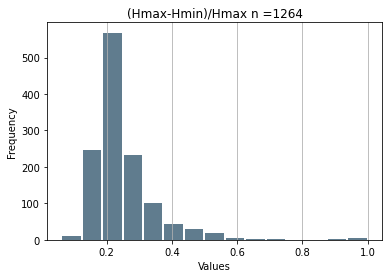

In [3]:
create_histogram(heights,title="(Hmax-Hmin)/Hmax",bins=15)

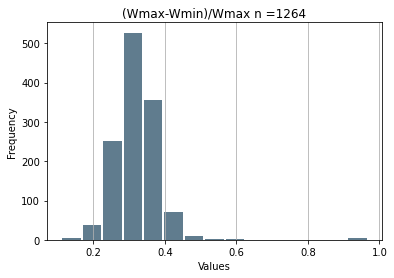

In [5]:
create_histogram(widths,title="(Wmax-Wmin)/Wmax",bins=15)

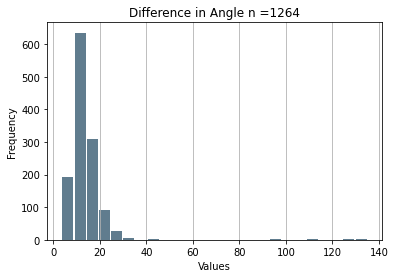

In [12]:
create_histogram(angles,title="Difference in Angle",bins=25)

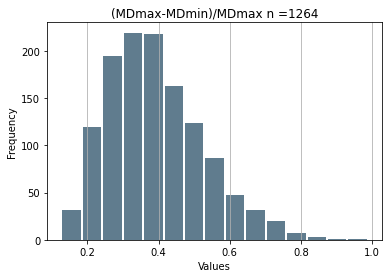

In [8]:
create_histogram(mitrals,title="(MDmax-MDmin)/MDmax",bins=15)